# <font color='white'> <b> **Violence Detection**  </b> </font>

>[Violence Detection](#scrollTo=W90DiJCM98_r)

>[Importing Relevant Libraries](#scrollTo=CAqw-2NDmIJw)

>[Loading Data](#scrollTo=l01FAM88srqg)

>[Data Exploration](#scrollTo=AbAHg1xZs0Yf)

>[Preparing the data](#scrollTo=E-IQtGTR0SQV)

>>[Extracting Features](#scrollTo=TQkYeuP60rAV)

>>[Splitting Data](#scrollTo=DdbQF6_81Dra)

>[Load the pretrained model](#scrollTo=6b9TpIpB1lxt)

>[Building The Model](#scrollTo=wZgCAA8L2bsy)

>[Callbacks and Fitting](#scrollTo=81ofHZX06RZF)



# Importing Relevant Libraries

In [ ]:
import os
import shutil
import cv2
import math
import random
import numpy as np
import datetime as dt
import tensorflow
import keras
from collections import deque
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

from sklearn.model_selection import train_test_split
from keras.layers import *
from keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from tensorflow.keras.utils import plot_model
from IPython.display import HTML
from base64 import b64encode

#Loading Data

In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#pip install rarfile

In [ ]:
# !unrar x '/content/drive/MyDrive/Real Life Violence Dataset.rar'  # This will extract the contents of the .rar file
# import rarfile

# # Replace the following paths with your actual paths
# rar_file_path = '/content/drive/MyDrive/Real Life Violence Dataset.rar'
# destination_folder = '/content/drive/MyDrive/Real Life Violence Dataset/'

# with rarfile.RarFile(rar_file_path, 'r') as rar:
#     rar.extractall(destination_folder)


In [ ]:
DATASET_DIR = "/content/drive/MyDrive/Real Life Violence Dataset/Real Life Violence Dataset"
NonViolnceVideos_Dir = "/content/drive/MyDrive/Real Life Violence Dataset/Real Life Violence Dataset/NonViolence/"
ViolnceVideos_Dir = "/content/drive/MyDrive/Real Life Violence Dataset/Real Life Violence Dataset/Violence/"

In [ ]:
# Retrieve the list of all the video files present in the Class Directory.
NonViolence_files_names_list = os.listdir(NonViolnceVideos_Dir)
Violence_files_names_list = os.listdir(ViolnceVideos_Dir)

#Data Exploration

In [ ]:
# Function to play a video
def Play_Video(filepath):
    html = ''
    video = open(filepath, 'rb').read()
    src = 'data:video/mp4;base64,' + b64encode(video).decode()
    html += '<video width=640 muted controls autoplay loop><source src="%s" type="video/mp4"></video>' % src
    return HTML(html)

In [ ]:
# Randomly select a video file from the Classes Directory.
Random_NonViolence_Video = random.choice(NonViolence_files_names_list)
Random_Violence_Video = random.choice(Violence_files_names_list)

**Playing a Random video from the Non Violence Directory**

In [ ]:
Play_Video(f"{NonViolnceVideos_Dir}/{Random_NonViolence_Video}")

**Playing a Random video from the Violence Directory**

In [ ]:
Play_Video(f"{ViolnceVideos_Dir}/{Random_Violence_Video}")


#Preparing the data

In [ ]:
# Specify the height and width to which each video frame will be resized in our dataset.

IMAGE_HEIGHT , IMAGE_WIDTH = 64, 64

# Specify the number of frames of a video that will be fed to the model as one sequence.

SEQUENCE_LENGTH = 15

CLASSES_LIST = ["NonViolence","Violence"]

In [ ]:
#For preprocessing videos
def frames_extraction(video_path):

    frames_list = []

    # Read the Video File
    video_reader = cv2.VideoCapture(video_path)

    # Get the total number of frames in the video.
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))

    # Calculate the the interval after which frames will be added to the list.
    skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH), 1)
    # Iterate through the Video Frames.
    for frame_counter in range(SEQUENCE_LENGTH):

        # Set the current frame position of the video.
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)

        # Reading the frame from the video.
        success, frame = video_reader.read()

        if not success:
            break

        # Resize the Frame to fixed height and width.
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))

        # Normalize the resized frame
        normalized_frame = resized_frame / 255

    # Append the normalized frame into the frames list
        frames_list.append(normalized_frame)


    video_reader.release()

    return frames_list

##Extracting Features

In [ ]:
#This Function will prepare the features and the labels for training and the video_files_paths for the frams_extraction
def create_dataset():

    features = []
    labels = []
    video_files_paths = []

    # Iterating through all the classes.
    for class_index, class_name in enumerate(CLASSES_LIST):

        print(f'Extracting Data of Class: {class_name}')

        # Get the list of video files present in the specific class name directory.
        files_list = os.listdir(os.path.join(DATASET_DIR, class_name))

        # Iterate through all the files present in the files list.
        for file_name in files_list:

            # Get the complete video path.
            video_file_path = os.path.join(DATASET_DIR, class_name, file_name)

            # Extract the frames of the video file.
            frames = frames_extraction(video_file_path)

            # Check if the extracted frames are equal to the SEQUENCE_LENGTH specified.
            # So ignore the videos having frames less than the SEQUENCE_LENGTH.
            if len(frames) == SEQUENCE_LENGTH:

                # Append the data to their repective lists.
                features.append(frames)
                labels.append(class_index)
                video_files_paths.append(video_file_path)

    features = np.asarray(features)
    labels = np.array(labels)
    return features, labels, video_files_paths

In [ ]:
# Call the create_dataset function to process the video data and generate features, labels, and video_files_paths
features, labels, video_files_paths = create_dataset()

Extracting Data of Class: NonViolence
Extracting Data of Class: Violence


In [ ]:
# Saving the extracted data
np.save("features.npy",features)
np.save("labels.npy",labels)
np.save("video_files_paths.npy",video_files_paths)

In [ ]:
# Load the saved data back into corresponding variables
features, labels, video_files_paths = np.load("features.npy") , np.load("labels.npy") ,  np.load("video_files_paths.npy")

In [ ]:
# Perform one-hot encoding on the labels using to_categorical
one_hot_encoded_labels = to_categorical(labels)

## Splitting Data

In [ ]:
# Split the data into training and testing sets
features_train, features_test, labels_train, labels_test = train_test_split(features, one_hot_encoded_labels, test_size = 0.1,
                                                                            shuffle = True, random_state = 42)
print(features_train.shape,labels_train.shape )
print(features_test.shape, labels_test.shape)

(1800, 15, 64, 64, 3) (1800, 2)
(200, 15, 64, 64, 3) (200, 2)


#Load The Pretrained Model

In [ ]:
from keras.applications.mobilenet_v2 import MobileNetV2

mobilenet = MobileNetV2(include_top=False , weights="imagenet")

#Fine-Tuning to make the last 40 layer trainable
mobilenet.trainable=True

for layer in mobilenet.layers[:-40]:
  layer.trainable=False

mobilenet.summary()

9406464/9406464 [==============================] - 0s 0us/step
Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 Conv1 (Conv2D)                 (None, None, None,   864         ['input_1[0][0]']                
                                32)                                                               
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, None, None,   128         ['Conv1[0][0]']                  
                

#Building The Model

In [ ]:
def create_model():

    model = Sequential()


    #Specifying Input to match features shape
    model.add(Input(shape = (SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH, 3)))

    # Passing mobilenet in the TimeDistributed layer to handle the sequence
    model.add(TimeDistributed(mobilenet))

    model.add(Dropout(0.25))
    model.add(TimeDistributed(Flatten()))

    lstm_fw = LSTM(units=32)
    lstm_bw = LSTM(units=32, go_backwards = True)

    model.add(Bidirectional(lstm_fw, backward_layer = lstm_bw))

    model.add(Dropout(0.25))

    model.add(Dense(256,activation='relu'))
    model.add(Dropout(0.25))

    model.add(Dense(128,activation='relu'))
    model.add(Dropout(0.25))

    model.add(Dense(64,activation='relu'))
    model.add(Dropout(0.25))

    model.add(Dense(32,activation='relu'))
    model.add(Dropout(0.25))


    model.add(Dense(len(CLASSES_LIST), activation = 'softmax'))


    model.summary()

    return model

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed (TimeDistr  (None, 15, 2, 2, 1280)   2257984   
 ibuted)                                                         
                                                                 
 dropout (Dropout)           (None, 15, 2, 2, 1280)    0         
                                                                 
 time_distributed_1 (TimeDis  (None, 15, 5120)         0         
 tributed)                                                       
                                                                 
 bidirectional (Bidirectiona  (None, 64)               1319168   
 l)                                                              
                                                                 
 dropout_1 (Dropout)         (None, 64)                0         
                                                        

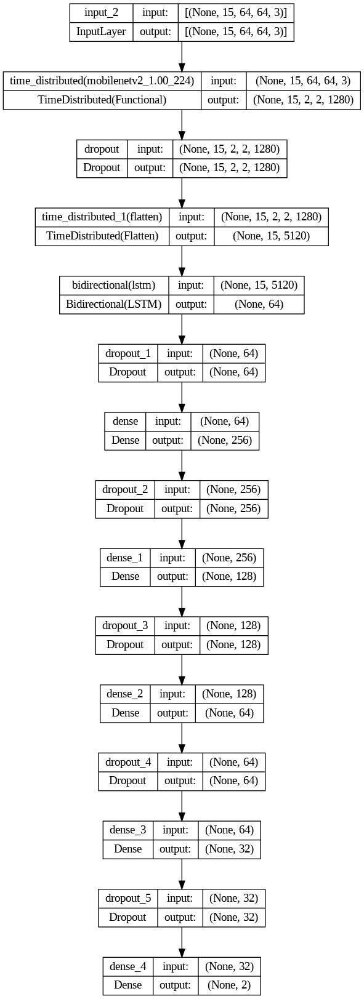

In [ ]:
MoBiLSTM_model = create_model()

# Plot the structure of the contructed LRCN model.
plot_model(MoBiLSTM_model, to_file = 'MobBiLSTM_model_structure_plot.png', show_shapes = True, show_layer_names = True)

#Callbacks and Fitting

In [ ]:
# Create Early Stopping Callback to monitor the accuracy
early_stopping_callback = EarlyStopping(monitor = 'val_accuracy', patience = 10, restore_best_weights = True)

# Create ReduceLROnPlateau Callback to reduce overfitting by decreasing learning
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss',
                                                  factor=0.6,
                                                  patience=5,
                                                  min_lr=0.00005,
                                                  verbose=1)

# Compiling the model
MoBiLSTM_model.compile(loss = 'categorical_crossentropy', optimizer = 'sgd', metrics = ["accuracy"])
# Fitting the model
MobBiLSTM_model_history = MoBiLSTM_model.fit(x = features_train, y = labels_train, epochs = 50, batch_size = 8 ,
                                             shuffle = True, validation_split = 0.2, callbacks = [early_stopping_callback,reduce_lr])

Epoch 1/50
180/180 [==============================] - 280s 1s/step - loss: 0.6978 - accuracy: 0.5201 - val_loss: 0.6778 - val_accuracy: 0.6056 - lr: 0.0100
Epoch 2/50
180/180 [==============================] - 258s 1s/step - loss: 0.6767 - accuracy: 0.5743 - val_loss: 0.6321 - val_accuracy: 0.7028 - lr: 0.0100
Epoch 3/50
180/180 [==============================] - 261s 1s/step - loss: 0.5926 - accuracy: 0.6931 - val_loss: 0.4673 - val_accuracy: 0.8250 - lr: 0.0100
Epoch 4/50
180/180 [==============================] - 263s 1s/step - loss: 0.4890 - accuracy: 0.7840 - val_loss: 0.5332 - val_accuracy: 0.7944 - lr: 0.0100
Epoch 5/50
180/180 [==============================] - 262s 1s/step - loss: 0.3848 - accuracy: 0.8438 - val_loss: 0.6905 - val_accuracy: 0.7861 - lr: 0.0100
Epoch 6/50
180/180 [==============================] - 256s 1s/step - loss: 0.3462 - accuracy: 0.8653 - val_loss: 0.4848 - val_accuracy: 0.8361 - lr: 0.0100
Epoch 7/50
180/180 [==============================] - 256s 1s/st

#Model Evaluation

In [ ]:
model_evaluation_history = MoBiLSTM_model.evaluate(features_test, labels_test)

7/7 [==============================] - 14s 2s/step - loss: 0.1752 - accuracy: 0.9400


In [ ]:
def plot_metric(model_training_history, metric_name_1, metric_name_2, plot_name):

    metric_value_1 = model_training_history.history[metric_name_1]
    metric_value_2 = model_training_history.history[metric_name_2]

    # Get the Epochs Count
    epochs = range(len(metric_value_1))

    plt.plot(epochs, metric_value_1, 'blue', label = metric_name_1)
    plt.plot(epochs, metric_value_2, 'orange', label = metric_name_2)

    plt.title(str(plot_name))

    plt.legend()

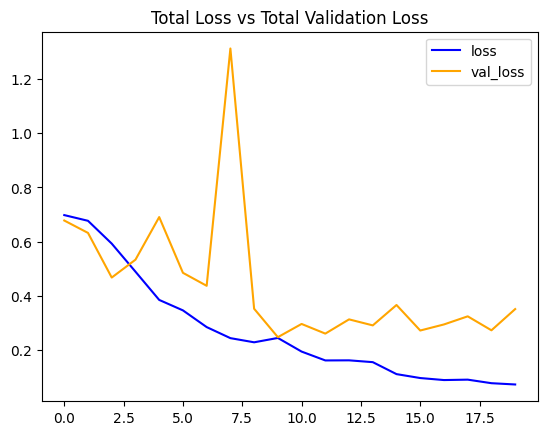

In [ ]:
plot_metric(MobBiLSTM_model_history, 'loss', 'val_loss', 'Total Loss vs Total Validation Loss')

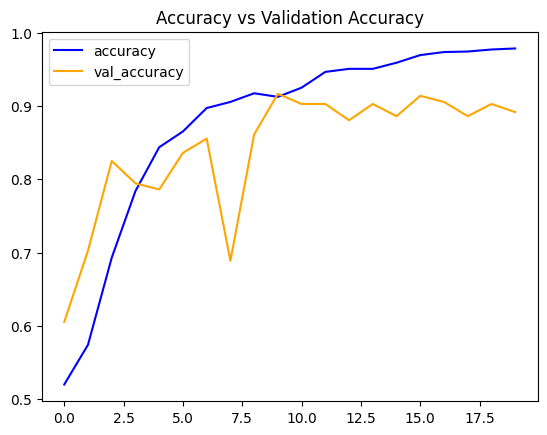

In [ ]:
plot_metric(MobBiLSTM_model_history, 'accuracy', 'val_accuracy', 'Accuracy vs Validation Accuracy')

##Test Set Prediction

In [ ]:
labels_predict = MoBiLSTM_model.predict(features_test)

labels_predict = np.argmax(labels_predict , axis=1)
labels_test_normal = np.argmax(labels_test , axis=1)

labels_test_normal.shape , labels_predict.shape

7/7 [==============================] - 39s 4s/step


((200,), (200,))

**Accuracy Score**

In [ ]:
from sklearn.metrics import accuracy_score
AccScore = accuracy_score(labels_predict, labels_test_normal)
print('Accuracy Score is : ', AccScore)

Accuracy Score is :  0.94


**Confusion Matrix**

[Text(0, 0.5, 'NonViolence'), Text(0, 1.5, 'Violence')]

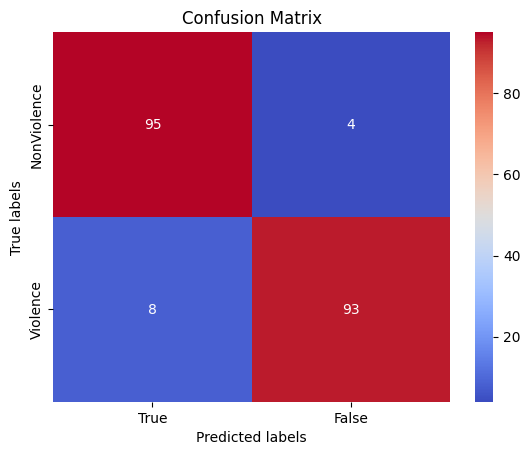

In [ ]:
from sklearn.metrics import confusion_matrix

ax = plt.subplot()
cm = confusion_matrix(labels_test_normal, labels_predict)

# Define a custom color map (e.g., 'coolwarm', 'viridis', 'plasma', 'inferno', etc.)
custom_cmap = sns.color_palette("coolwarm", as_cmap=True)

sns.heatmap(cm, annot=True, fmt='g', ax=ax, cmap=custom_cmap)  # Use the custom colormap

ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(['True', 'False'])
ax.yaxis.set_ticklabels(['NonViolence', 'Violence'])


**Classification Report**

In [ ]:
from sklearn.metrics import classification_report

ClassificationReport = classification_report(labels_test_normal,labels_predict)
print('Classification Report is : \n', ClassificationReport)


Classification Report is : 
               precision    recall  f1-score   support

           0       0.92      0.96      0.94        99
           1       0.96      0.92      0.94       101

    accuracy                           0.94       200
   macro avg       0.94      0.94      0.94       200
weighted avg       0.94      0.94      0.94       200



## Frame By Frame Prediction

In [ ]:
def predict_frames(video_file_path, output_file_path, SEQUENCE_LENGTH):

    # Read from the video file.
    video_reader = cv2.VideoCapture(video_file_path)

    # Get the width and height of the video.
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))

    # VideoWriter to store the output video in the disk.
    video_writer = cv2.VideoWriter(output_file_path, cv2.VideoWriter_fourcc('m', 'p', '4', 'v'),
                                    video_reader.get(cv2.CAP_PROP_FPS), (original_video_width, original_video_height))
    # Declare a queue to store video frames.
    frames_queue = deque(maxlen = SEQUENCE_LENGTH)

    # Store the predicted class in the video.
    predicted_class_name = ''

    # Iterate until the video is accessed successfully.
    while video_reader.isOpened():

        ok, frame = video_reader.read()

        if not ok:
            break

        # Resize the Frame to fixed Dimensions.
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))

        # Normalize the resized frame
        normalized_frame = resized_frame / 255

        # Appending the pre-processed frame into the frames list.
        frames_queue.append(normalized_frame)

        # We Need at Least number of SEQUENCE_LENGTH Frames to perform a prediction.
        # Check if the number of frames in the queue are equal to the fixed sequence length.
        if len(frames_queue) == SEQUENCE_LENGTH:

            # Pass the normalized frames to the model and get the predicted probabilities.
            predicted_labels_probabilities = MoBiLSTM_model.predict(np.expand_dims(frames_queue, axis = 0))[0]

            # Get the index of class with highest probability.
            predicted_label = np.argmax(predicted_labels_probabilities)

            # Get the class name using the retrieved index.
            predicted_class_name = CLASSES_LIST[predicted_label]

         # Write predicted class name on top of the frame.
        if predicted_class_name == "Violence":
            cv2.putText(frame, predicted_class_name, (5, 100), cv2.FONT_HERSHEY_SIMPLEX, 3, (0, 0, 255), 12)
        else:
            cv2.putText(frame, predicted_class_name, (5, 100), cv2.FONT_HERSHEY_SIMPLEX, 3, (0, 255, 0), 12)

        # Write The frame into the disk using the VideoWriter
        video_writer.write(frame)

    video_reader.release()
    video_writer.release()


In [ ]:
plt.style.use("default")

# To show Random Frames from the saved output predicted video (output predicted video doesn't show on the notebook but can be downloaded)
def show_pred_frames(pred_video_path):

    plt.figure(figsize=(20,15))

    video_reader = cv2.VideoCapture(pred_video_path)

    # Get the number of frames in the video.
    frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))

    # Get Random Frames from the video then Sort it
    random_range = sorted(random.sample(range (SEQUENCE_LENGTH , frames_count ), 12))

    for counter, random_index in enumerate(random_range, 1):

        plt.subplot(5, 4, counter)

        # Set the current frame position of the video.
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, random_index)

        ok, frame = video_reader.read()

        if not ok:
              break

        frame = cv2.cvtColor(frame , cv2.COLOR_BGR2RGB)

        plt.imshow(frame);ax.figure.set_size_inches(20,20);plt.tight_layout()

    video_reader.release()

In [ ]:
# Construct the output video path.
test_videos_directory = 'test_videos'
os.makedirs(test_videos_directory, exist_ok = True)

output_video_file_path = f'{test_videos_directory}/Output-Test-Video.mp4'

1/1 [==============================] - 0s 82ms/step


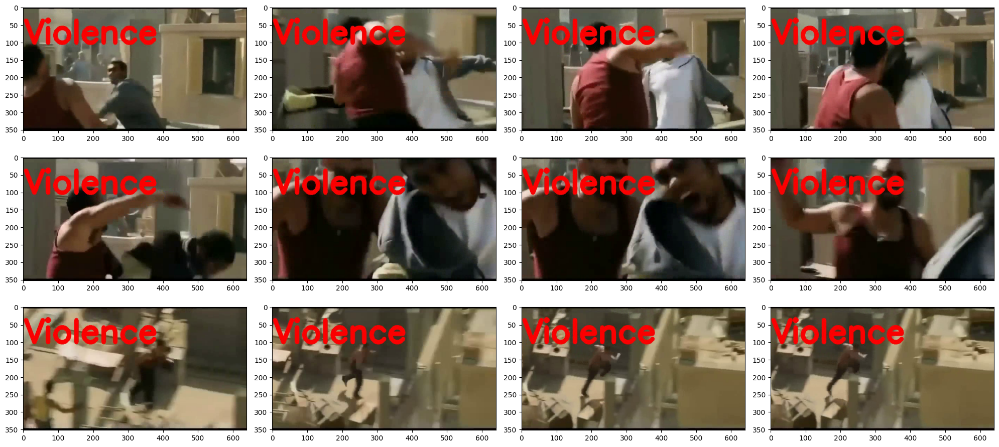

In [ ]:
# Specifying video to be predicted
input_video_file_path = "/content/drive/MyDrive/Real Life Violence Dataset/Real Life Violence Dataset/Violence/V_378.mp4"

# Perform Prediction on the Test Video.
predict_frames(input_video_file_path, output_video_file_path, SEQUENCE_LENGTH)

# Show random frames from the output video
show_pred_frames(output_video_file_path)

In [ ]:
# Play the actual video
Play_Video(input_video_file_path)

1/1 [==============================] - 0s 86ms/step


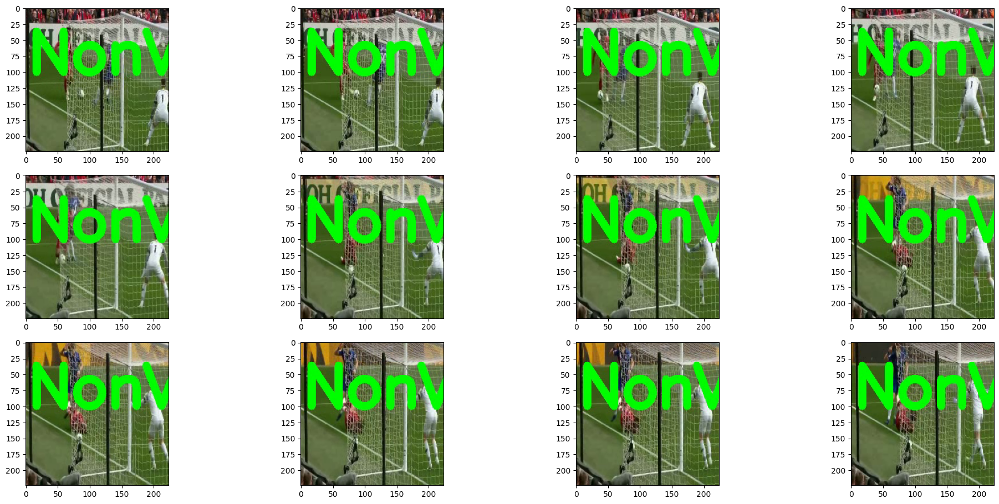

In [ ]:
# Specifying video to be predicted
input_video_file_path = "/content/drive/MyDrive/Real Life Violence Dataset/Real Life Violence Dataset/NonViolence/NV_100.mp4"

# Perform Prediction on the Test Video.
predict_frames(input_video_file_path, output_video_file_path, SEQUENCE_LENGTH)

# Show random frames from the output video
show_pred_frames(output_video_file_path)

In [ ]:
# Play the actual video
Play_Video(input_video_file_path)

##Video Prediction

In [ ]:
def predict_video(video_file_path, SEQUENCE_LENGTH):

    video_reader = cv2.VideoCapture(video_file_path)

    # Get the width and height of the video.
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))

    # Declare a list to store video frames we will extract.
    frames_list = []

    # Store the predicted class in the video.
    predicted_class_name = ''

     # Get the number of frames in the video.
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))

    # Calculate the interval after which frames will be added to the list.
    skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH),1)

    # Iterating the number of times equal to the fixed length of sequence.
    for frame_counter in range(SEQUENCE_LENGTH):

        # Set the current frame position of the video.
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)

        success, frame = video_reader.read()

        if not success:
            break

        # Resize the Frame to fixed Dimensions.
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))

        # Normalize the resized frame.
        normalized_frame = resized_frame / 255

        # Appending the pre-processed frame into the frames list
        frames_list.append(normalized_frame)


    # Passing the  pre-processed frames to the model and get the predicted probabilities.
    predicted_labels_probabilities = MoBiLSTM_model.predict(np.expand_dims(frames_list, axis = 0))[0]

    # Get the index of class with highest probability.
    predicted_label = np.argmax(predicted_labels_probabilities)

    # Get the class name using the retrieved index.
    predicted_class_name = CLASSES_LIST[predicted_label]

    # Display the predicted class along with the prediction confidence.
    print(f'Predicted: {predicted_class_name}\nConfidence: {predicted_labels_probabilities[predicted_label]}')

    video_reader.release()

In [ ]:
# Specifying video to be predicted
input_video_file_path = "/content/drive/MyDrive/Real Life Violence Dataset/Real Life Violence Dataset/Violence/V_32.mp4"

# Perform Single Prediction on the Test Video.
predict_video(input_video_file_path, SEQUENCE_LENGTH)

# Play the actual video
Play_Video(input_video_file_path)

1/1 [==============================] - 0s 204ms/step
Predicted: Violence
Confidence: 0.9696977734565735


In [ ]:
#Specifying video to be predicted
input_video_file_path = "/content/drive/MyDrive/Real Life Violence Dataset/Real Life Violence Dataset/NonViolence/NV_6.mp4"

# Perform Single Prediction on the Test Video.
predict_video(input_video_file_path, SEQUENCE_LENGTH)

# Play the actual video
Play_Video(input_video_file_path)

1/1 [==============================] - 0s 146ms/step
Predicted: NonViolence
Confidence: 0.8390418887138367


#Saving The Model

In [ ]:
# Save the trained model to Google Drive
MoBiLSTM_model.save('/content/drive/MyDrive/Model.h5')

In [ ]:
!ls '/content/drive/MyDrive'

'AWS Certified Cloud Practitioner certificate.pdf'
'AWS Certified Cloud Practitioner Slides v2.6.pdf'
'AWS Certified Solutions Architect Slides v4.8.2.pdf'
'Ayoub Ben Mahmoud.gsheet'
'BioAI workshop .pdf'
'Colab Notebooks'
'DF Motivation Letter.pdf'
'Df My cv.pdf'
'Document sans titre.gdoc'
 English.pdf
 hateful_memes
 Model.h5
'Présentation sans titre.gslides'
 Projet
'Real Life Violence Dataset'
'Real Life Violence Dataset.rar'
 SampleSubmission.csv
 spam.csv
'Student ID card.jpeg'
 test.csv
 TP6.classification.Texte.pdf
 train.csv
 Transcript.jpeg
 video_2023-08-19_13-23-06.mp4
'WhatsApp Image 2022-10-20 at 11.25.32 AM.jpeg'


In [ ]:
!cp '/content/drive/MyDrive/Model.h5' '/content/'

In [ ]:
from keras.models import load_model

model = load_model('Model.h5')